In [ ]:
import sys
print(sys.version)

3.7.12 | packaged by conda-forge | (default, Oct 26 2021, 05:35:01) [MSC v.1916 64 bit (AMD64)]


 # Importing the useful python modules

In [ ]:
!pip install tslearn

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
from plotly import graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import plotly.express as px

from keras.layers import LSTM,Dense,Conv1D,MaxPooling1D,Flatten,TimeDistributed,RepeatVector,GRU
from keras.models import Sequential
from keras.losses import mean_squared_error
#from keras.optimizers import Adam
from sklearn.metrics import r2_score
import tensorflow as tf

from datetime import datetime, timedelta

from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score,mean_squared_error

import itertools
import random
import os

from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import tensorflow as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.utils import *
from scipy.stats import zscore

from numpy import array


import tslearn
from tslearn.clustering import KShape
from scipy.stats import zscore

Using TensorFlow backend.
C:\Users\PC\anaconda3\envs\py37\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\PC\anaconda3\envs\py37\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\PC\anaconda3\envs\py37\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\PC\anaconda3\envs\py37\lib\site-packages\tensorflo

# Data preprocessing

## Sorting the useful and qualitative data from the measurements file

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/AlmudenaMaroto/OMP_1/main/Predis_Energy.csv',encoding="utf-8",sep=',')
#df1 = pd.read_csv('load.csv',encoding="utf-8",sep=',')

In [ ]:
df.head()

,epochtime_ms,date_time,CTA,Eclairage,PC,conso_global
0,1451606400000,01/01/2016 01:00:00,0.5,0.0,0.1899,0.6899
1,1451610000000,01/01/2016 02:00:00,0.5,0.0,0.1800,0.6800
2,1451613600000,01/01/2016 03:00:00,0.0,0.0,0.9600,0.9600
3,1451617200000,01/01/2016 04:00:00,0.0,0.0,0.2500,0.2500
4,1451620800000,01/01/2016 05:00:00,0.0,0.0,0.2600,0.2600


The next cell is dedicated to removing the outliers and the columns Eclairage, PC and CTA because they won't be used in the project

In [ ]:
df['date_time']=pd.to_datetime(df['date_time'],format='%d/%m/%Y %H:%M:%S')

In [ ]:
df['Hour'] = df['date_time'].dt.hour
df

,epochtime_ms,date_time,CTA,Eclairage,PC,conso_global,Hour
0,1451606400000,2016-01-01 01:00:00,0.50,0.0,0.1899,0.6899,1
1,1451610000000,2016-01-01 02:00:00,0.50,0.0,0.1800,0.6800,2
2,1451613600000,2016-01-01 03:00:00,0.00,0.0,0.9600,0.9600,3
3,1451617200000,2016-01-01 04:00:00,0.00,0.0,0.2500,0.2500,4
4,1451620800000,2016-01-01 05:00:00,0.00,0.0,0.2600,0.2600,5
...,...,...,...,...,...,...,...
39113,1592460000000,2020-06-18 08:00:00,41364.50,0.0,2.3400,41366.8400,8
39114,1592463600000,2020-06-18 09:00:00,-41364.50,0.0,5.6600,-41358.8400,9
39115,1592467200000,2020-06-18 10:00:00,41367.16,0.0,0.5000,41367.6600,10
39116,1592470800000,2020-06-18 11:00:00,-41367.16,0.0,0.5000,-41366.6600,11


In [ ]:
for i in range(1,len(df)-1):
  if df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != 1 and df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != -23:
    print([df['Hour'].iloc[i+1],df['Hour'].iloc[i],df['date_time'].iloc[i]])
    # df = df.append(pd.DataFrame(np.array([df.iloc[i]]),columns=['epochtime_ms','date_time','CTA','Eclairage','PC','conso_global','Hour']))
    df.loc[df.shape[0]] = df.iloc[i]
    print(df.iloc[df.shape[0]-1])
    # print(df.iloc[len(df)-1])
    df['date_time'].iloc[len(df)-1] = df['date_time'].iloc[i] + timedelta(hours=1)
    df['Hour'].iloc[len(df)-1] = df['Hour'].iloc[i] + 1
    newindex= list(range(0,i+1))+[len(df)-1]+list(range(i+1,len(df)-1))
    print(newindex)
    df = df.reindex(newindex)
    print(df.tail)
    df = df.reset_index(drop=True)

[2, 0, Timestamp('2016-03-27 00:00:00')]
epochtime_ms          1459033200000
date_time       2016-03-27 00:00:00
CTA                             0.0
Eclairage                       0.0
PC                           0.0898
conso_global                 0.0898
Hour                              0
Name: 39118, dtype: object
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,

C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


epochtime_ms          1490482800000
date_time       2017-03-26 00:00:00
CTA                             0.0
Eclairage                       0.0
PC                              0.5
conso_global                    0.5
Hour                              0
Name: 39119, dtype: object
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 

C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


[2, 0, Timestamp('2018-03-25 00:00:00')]
epochtime_ms          1521932400000
date_time       2018-03-25 00:00:00
CTA                             0.0
Eclairage                       0.0
PC                             0.17
conso_global                   0.17
Hour                              0
Name: 39120, dtype: object
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,

C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


[2, 0, Timestamp('2019-03-31 00:00:00')]
epochtime_ms          1553986800000
date_time       2019-03-31 00:00:00
CTA                             0.0
Eclairage                       0.0
PC                              0.5
conso_global                    0.5
Hour                              0
Name: 39121, dtype: object
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,

C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


[2, 0, Timestamp('2020-03-29 00:00:00')]
epochtime_ms          1585436400000
date_time       2020-03-29 00:00:00
CTA                             0.0
Eclairage                       0.0
PC                             0.22
conso_global                   0.22
Hour                              0
Name: 39122, dtype: object
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157,

C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [ ]:
for i in range(1,39116):
  if df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != 1 and df['Hour'].iloc[i+1] - df['Hour'].iloc[i] != -23:
    print([df['Hour'].iloc[i+1],df['Hour'].iloc[i],df['date_time'].iloc[i]])

In [ ]:
df.loc[-1] = df.iloc[0]  # adding a row
df['date_time'].iloc[-1] = df['date_time'].iloc[-1] - timedelta(hours=1)
df['Hour'].iloc[-1] = df['Hour'].iloc[-1] - 1
df.index = df.index + 1  # shifting index
df.sort_index(inplace=True)

C:\Users\PC\anaconda3\envs\py37\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:



#df = df[df.conso_global > -20] ## Here if we pùt 0 we delete a lot of data of 2019 that is negative. Maybe a mistake in the measure.

df.conso_global = np.where(df.conso_global < 0, 0,df.conso_global)

y = df['conso_global']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996))
index_names = df[~removed_outliers].index

one_week = 24*7
for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0

conso_glob_outliers=len(index_names)



y = df['CTA']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996))
index_names = df[~removed_outliers].index
CTA_outliers=len(index_names)
print(index_names)


for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0

y = df['Eclairage']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996))
index_names = df[~removed_outliers].index
Eclairage_outliers=len(index_names)

for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0


y = df['PC']
removed_outliers = y.between(y.quantile(.002),y.quantile(.996))
index_names = df[~removed_outliers].index
PC_outliers=len(index_names)
print(index_names)

for idx in index_names:
  if idx>one_week:
    df.loc[idx,['conso_global']] = df.loc[idx-one_week,['conso_global']]
  else :
    df.loc[idx,['conso_global']] = 0



df1 = df.set_index('date_time')

# print("total outliers : ", CTA_outliers+Eclairage_outliers+PC_outliers, "conso glob outliers :",conso_glob_outliers)

df = df.drop(columns=['epochtime_ms', 'CTA', 'Eclairage','PC' ])
df1 = df1.drop(columns=['epochtime_ms', 'CTA', 'Eclairage','PC' ])





Int64Index([ 4144,  4145,  4146,  4147,  4162,  4163,  4164,  4173,  4180,
             4181,
            ...
            39112, 39121, 39122, 39125, 39126, 39127, 39128, 39129, 39130,
            39131],
           dtype='int64', length=228)
Int64Index([11888, 14366, 14367, 14368, 14627, 14641, 14858, 24493, 27463,
            28144,
            ...
            37955, 37956, 37957, 37958, 38318, 38590, 38793, 38917, 38962,
            39132],
           dtype='int64', length=233)


Méthode 2 : méthode utilisée l'année dernière : celle ci retire les lignes contenant des outliers

In [ ]:
### features souhaitées :

utilisation_calendrier=1
jour_moins_7=1


In [ ]:
df.head()

,date_time,conso_global,Hour
0,2016-01-01 00:00:00,0.6899,0
1,2016-01-01 01:00:00,0.6899,1
2,2016-01-01 02:00:00,0.6800,2
3,2016-01-01 03:00:00,0.9600,3
4,2016-01-01 04:00:00,0.2500,4


In [ ]:
fig = px.line(df, x ='date_time', y = 'conso_global', title = 'Time series with slider')
fig.update_xaxes(rangeslider_visible = True)
fig.show()

In [ ]:
df = df[df.date_time >= '2017-09-01']
df = df[df.date_time < '2020-02-01']
df = df.reset_index()
df.drop(columns = ['index'],inplace=True, axis=1)
df.head()
df = df.set_index('date_time')

# Clustering the data for extracting different consumption profiles

In [ ]:
# Seperate the day information for grouping timeseries of load
df = df.reset_index()
df_cluster = df.copy()
df_cluster['Date'] = df_cluster['date_time'].dt.date
df_cluster['Hour'] = df_cluster['date_time'].dt.hour
df_cluster.drop(columns=['date_time'], inplace=True)


In [ ]:
df_cluster

,conso_global,Hour,Date
0,0.3398,0,2017-09-01
1,0.3506,1,2017-09-01
2,0.1494,2,2017-09-01
3,0.1602,3,2017-09-01
4,0.4804,4,2017-09-01
...,...,...,...
21187,0.9999,19,2020-01-31
21188,0.1700,20,2020-01-31
21189,0.5000,21,2020-01-31
21190,0.5000,22,2020-01-31


In [ ]:
for i in range(1,21187):
  if df_cluster['Hour'].iloc[i+1] - df_cluster['Hour'].iloc[i] != 1 and df_cluster['Hour'].iloc[i+1] - df_cluster['Hour'].iloc[i] != -23:
    print([df_cluster['Hour'].iloc[i+1],df_cluster['Hour'].iloc[i],df_cluster['Date'].iloc[i]])



In [ ]:
# Group into timeseries of load
df_cluster_ts= df_cluster.groupby(['Date']).agg(lambda x: list(x)).reset_index().sort_values(by='Date')
df_cluster_ts

,Date,conso_global,Hour
0,2017-09-01,"[0.3398000000015599, 0.3505999999997584, 0.149...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,2017-09-02,"[0.4003999999986263, 0.0898999999990337, 0.290...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,2017-09-03,"[0.2002000000011321, 0.2099999999991268, 0.200...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,2017-09-04,"[0.3398999999990337, 0.1797000000005937, 0.169...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,2017-09-05,"[0.1894000000011146, 0.1904999999987922, 0.699...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
...,...,...,...
878,2020-01-27,"[0.3300000000017462, 0.2789999999986321, 0.282...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
879,2020-01-28,"[0.8689000000003944, 0.8009999999994761, 0.620...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
880,2020-01-29,"[1.7089999999952852, 0.7110000000029686, 0.5, ...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
881,2020-01-30,"[0.4490000000005238, 0.5799999999981083, 0.410...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


In [ ]:
# Include zscore of timeseries for further analysis
date_str = df_cluster_ts.Date.apply(lambda x: x.strftime('%Y-%m-%d')).str.split('-', expand=True)
df_zscore = df_cluster_ts.conso_global.apply(zscore)
df_weekday = df_cluster_ts.Date.apply(lambda x: x.strftime('%A'))
df_month = df_cluster_ts.Date.apply(lambda x: x.strftime('%B'))
df_cluster_ts.insert(1, 'year', date_str[0])
df_cluster_ts.insert(2, 'month', df_month)
df_cluster_ts.insert(3, 'day', date_str[2])
df_cluster_ts.insert(4, 'weekday', df_weekday)
df_cluster_ts.insert(6, 'z_score', df_zscore)
df_cluster_ts

,Date,year,month,day,weekday,conso_global,z_score,Hour
0,2017-09-01,2017,September,01,Friday,"[0.3398000000015599, 0.3505999999997584, 0.149...","[-0.8491049098272412, -0.8387497283033392, -1....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,2017-09-02,2017,September,02,Saturday,"[0.4003999999986263, 0.0898999999990337, 0.290...","[0.17868823668773878, -0.9996010649947241, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,2017-09-03,2017,September,03,Sunday,"[0.2002000000011321, 0.2099999999991268, 0.200...","[-0.3177756994168771, -0.3074747161226642, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,2017-09-04,2017,September,04,Monday,"[0.3398999999990337, 0.1797000000005937, 0.169...","[-0.7486538025596414, -0.8677800685574014, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,2017-09-05,2017,September,05,Tuesday,"[0.1894000000011146, 0.1904999999987922, 0.699...","[-1.0873628229151275, -1.0864205210429443, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
...,...,...,...,...,...,...,...,...
878,2020-01-27,2020,January,27,Monday,"[0.3300000000017462, 0.2789999999986321, 0.282...","[-1.0581166010026168, -1.0755571439558498, -1....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
879,2020-01-28,2020,January,28,Tuesday,"[0.8689000000003944, 0.8009999999994761, 0.620...","[-0.8910882846150274, -0.9254772192038647, -1....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
880,2020-01-29,2020,January,29,Wednesday,"[1.7089999999952852, 0.7110000000029686, 0.5, ...","[-0.44237388413534157, -0.9901299867138765, -1...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
881,2020-01-30,2020,January,30,Thursday,"[0.4490000000005238, 0.5799999999981083, 0.410...","[-0.9133843570052629, -0.8557582775323775, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


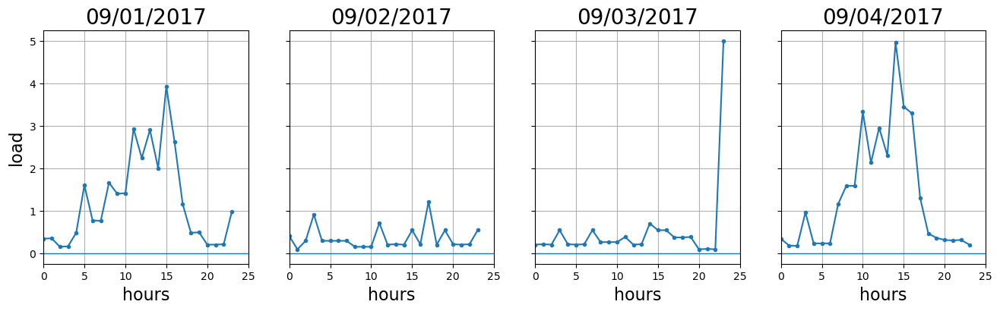

In [ ]:
def plot_series(series, x_label="$t$", y_label="$x(t)$", title=None):
    plt.plot(series, ".-")
    n_steps = len(series)
    plt.grid(True)
    if x_label:
        plt.xlabel(x_label, fontsize=16)
    if y_label:
        plt.ylabel(y_label, fontsize=16)
    plt.hlines(0, 0, 100, linewidth=1)
    plt.xlim([0, len(series) + 1])
    plt.title(title, fontsize=20)


time_series_new = df_cluster_ts[:4]

ncols = time_series_new.shape[0]
fig, axes = plt.subplots(nrows=1, ncols=ncols, sharey=True, figsize=(16, 4))
for col in range(ncols):
    plt.sca(axes[col])
    plot_series(time_series_new.conso_global[col], x_label="hours",
                y_label=("load" if col==0 else None), title=time_series_new.Date[col].strftime('%m/%d/%Y'))

In [ ]:
# Add the third dimesion for kshape function
# data_array = df_cluster_ts['conso_global'].to_list()
# ts_array = np.expand_dims(data_array, axis=data_array.ndim)
# ts_array.shape
# data_array
# data_array[0]

# Add the third dimesion for kshape function
data_array = np.array(df_cluster_ts['conso_global'].to_list())
ts_array = np.expand_dims(data_array, axis=data_array.ndim)
ts_array.shape
ts_array
data_array.shape

(883, 24)

## DTW CLUSTERING

In [ ]:
from tslearn.clustering import TimeSeriesKMeans
DTWClust = TimeSeriesKMeans(n_clusters=4, metric="softdtw", max_iter=50, random_state=0)
DTWClust.fit(ts_array)
labels = DTWClust.predict(ts_array)

# Group timeseries
ts_clustered = []
for i in range(max(labels)+1):
    ts_clustered.append(df_cluster_ts[labels==i].reset_index(drop=True))

In [ ]:

ts_clustered[0]

,Date,year,month,day,weekday,conso_global,z_score,Hour
0,2017-09-02,2017,September,02,Saturday,"[0.4003999999986263, 0.0898999999990337, 0.290...","[0.17868823668773878, -0.9996010649947241, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,2017-09-03,2017,September,03,Sunday,"[0.2002000000011321, 0.2099999999991268, 0.200...","[-0.3177756994168771, -0.3074747161226642, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,2017-09-09,2017,September,09,Saturday,"[0.1904000000013184, 0.1796999999987747, 0.190...","[-0.35120121684687267, -0.3931278927378355, -0...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,2017-09-10,2017,September,10,Sunday,"[0.1298999999999068, 0.6894000000011147, 0.270...","[-0.897419249562699, 1.0582984392487123, -0.40...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,2017-09-16,2017,September,16,Saturday,"[1.580100000001039, 0.1405999999988125, 0.1298...","[3.273395783943635, -0.6791439913855593, -0.70...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
...,...,...,...,...,...,...,...,...
281,2020-01-12,2020,January,12,Sunday,"[0.25, 0.5, 0.5, 0.5, 0.25, 0.25, 1.0, 0.66999...","[-1.1990082605627517, -0.4101005334679525, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
282,2020-01-18,2020,January,18,Saturday,"[0.737899999999172, 1.0708999999978914, 0.7301...","[-0.17796651045920808, 0.5708533018850238, -0....","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
283,2020-01-19,2020,January,19,Sunday,"[1.3301000000001295, 0.3298999999997249, 0.670...","[0.5575475446016959, -1.6428696095896889, -0.8...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
284,2020-01-25,2020,January,25,Saturday,"[0.1409999999996216, 1.2280999999975393, 1.060...","[-0.8484976061715503, 1.44889155364604, 1.0955...","[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


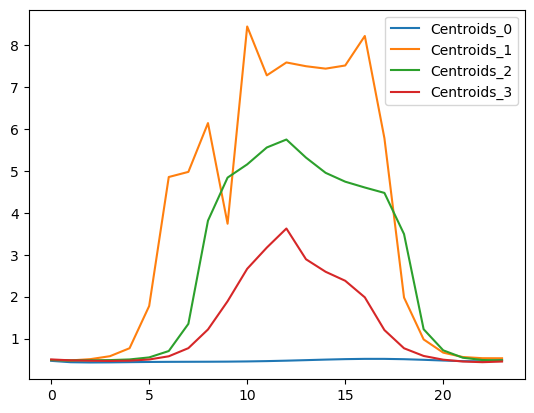

In [ ]:
for i in range(max(labels)+1):
    plt.plot(DTWClust.cluster_centers_[i], label="Centroids_" + str(i))
    plt.legend()

In [ ]:
clsmodel = DTWClust

In [ ]:
weekend = ['Saturday', 'Sunday']
weekday = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']

## Cluster 1

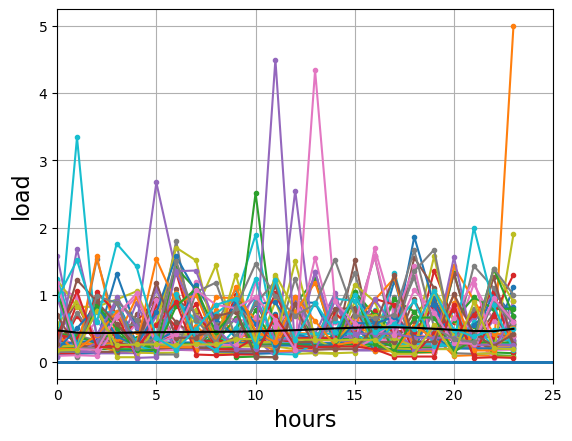

In [ ]:
# raw_data
i=0
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(50):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  286 

Number of time-series for different week days: 

Sunday       122
Saturday     122
Monday        10
Tuesday        9
Friday         8
Thursday       8
Wednesday      7
Name: weekday, dtype: int64


Number of time-series for different months: 

December     47
January      31
September    28
August       27
October      25
November     24
June         20
May          18
April        18
March        17
July         16
February     15
Name: month, dtype: int64


## Cluster 2

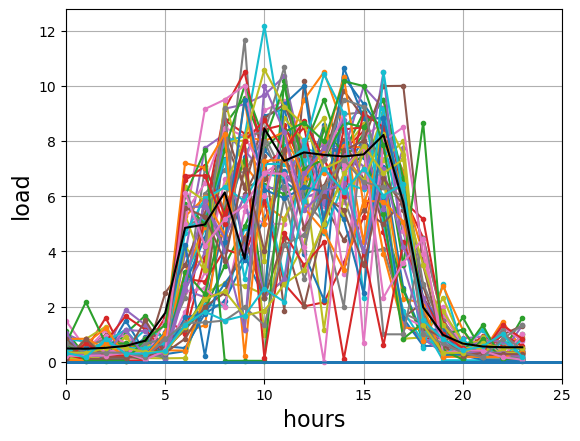

In [ ]:
# raw data
i=1
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(50):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  64 

Number of time-series for different week days: 

Thursday     15
Monday       13
Tuesday      12
Friday       12
Wednesday    10
Sunday        1
Saturday      1
Name: weekday, dtype: int64


Number of time-series for different months: 

December    17
November    13
July        11
January      9
June         4
March        4
February     3
August       2
May          1
Name: month, dtype: int64


## Cluster 3

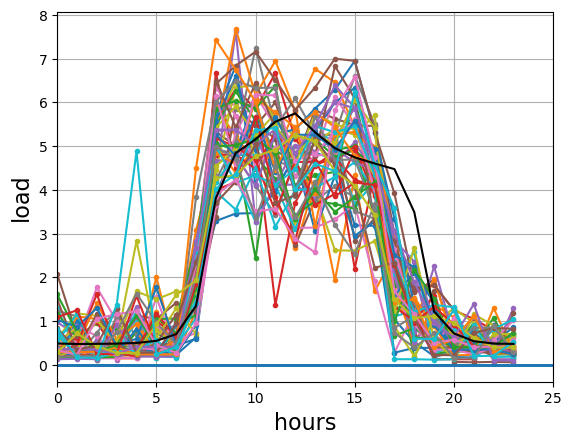

In [ ]:
# raw data
i=2
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(50):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  220 

Number of time-series for different week days: 

Monday       47
Tuesday      46
Wednesday    46
Thursday     41
Friday       39
Saturday      1
Name: weekday, dtype: int64


Number of time-series for different months: 

January      43
November     37
February     29
December     26
July         18
March        16
September    12
August       11
April        10
May           8
June          7
October       3
Name: month, dtype: int64


## Cluster 4

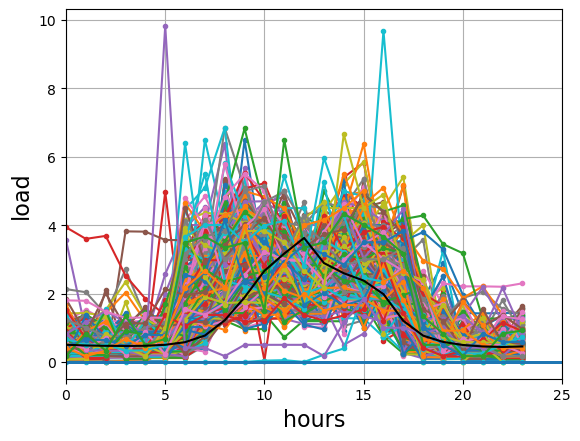

In [ ]:
# raw data
i=3
n = ts_clustered[i].__len__()
rand_index = np.arange(n)
np.random.shuffle(rand_index)
ts_group = ts_clustered[i].iloc[rand_index]
for j in range(n):
    plot_series(ts_group.conso_global[j], x_label=("hours" if j==0 else None),
                y_label=("load" if j==0 else None))
plt.plot(clsmodel.cluster_centers_[i], color='k');

In [ ]:
# Check day and month information according daily load sequences
print("Total of days: ", ts_clustered[i].__len__(), "\n")
print("Number of time-series for different week days: \n")
print(ts_group.weekday.value_counts())
print("\n")
print("Number of time-series for different months: \n")
print(ts_group.month.value_counts())

Total of days:  313 

Number of time-series for different week days: 

Friday       68
Wednesday    63
Thursday     62
Tuesday      59
Monday       56
Sunday        3
Saturday      2
Name: weekday, dtype: int64


Number of time-series for different months: 

October      65
September    50
May          35
April        32
June         29
March        25
August       22
July         17
November     16
January      10
February      9
December      3
Name: month, dtype: int64


## Adding cluster feature to the dataframe

In [ ]:
df.loc[df['date_time'].dt.date == ts_clustered[0]['Date'].iloc[1]]

,date_time,conso_global,Hour
48,2017-09-03 00:00:00,0.2002,0
49,2017-09-03 01:00:00,0.2100,1
50,2017-09-03 02:00:00,0.2002,2
51,2017-09-03 03:00:00,0.5400,3
52,2017-09-03 04:00:00,0.2100,4
53,2017-09-03 05:00:00,0.2002,5
54,2017-09-03 06:00:00,0.2099,6
55,2017-09-03 07:00:00,0.5401,7
56,2017-09-03 08:00:00,0.2597,8
57,2017-09-03 09:00:00,0.2598,9


In [ ]:
# df['Cluster'] = 4
# for i in range(0,3):
#   for k in range (0,len(df)):
#     for j in range (0,len(ts_clustered[i])):
#       if ts_clustered[i]['Date'].iloc[j] == df['date_time'].dt.date.iloc[k]:
#         df['Cluster'].iloc[k] = i+1
cluster_idx=[[],[],[],[]]
df['Cluster'] = 4
for i in range(0,4):
  for j in range (0,len(ts_clustered[i])):
      df.loc[df['date_time'].dt.date == ts_clustered[i]['Date'].iloc[j],'Cluster'] = i+1
      cluster_idx[i] = cluster_idx[i] + list(df.loc[df['date_time'].dt.date == ts_clustered[i]['Date'].iloc[j]].index)

In [ ]:
cluster_idx[3]

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,


In [ ]:
df.loc[df['date_time'].dt.date == ts_clustered[i]['Date'].iloc[3]]

,date_time,conso_global,Hour,Cluster
144,2017-09-07 00:00:00,1.3096,0,4
145,2017-09-07 01:00:00,0.4209,1,4
146,2017-09-07 02:00:00,0.4199,2,4
147,2017-09-07 03:00:00,0.4199,3,4
148,2017-09-07 04:00:00,0.4102,4,4
149,2017-09-07 05:00:00,0.1992,5,4
150,2017-09-07 06:00:00,0.2002,6,4
151,2017-09-07 07:00:00,0.9502,7,4
152,2017-09-07 08:00:00,3.1601,8,4
153,2017-09-07 09:00:00,3.8399,9,4


(array([6864.,    0.,    0., 1536.,    0.,    0., 5280.,    0.,    0.,
        7512.]),
 array([1. , 1.3, 1.6, 1.9, 2.2, 2.5, 2.8, 3.1, 3.4, 3.7, 4. ]),
 <BarContainer object of 10 artists>)

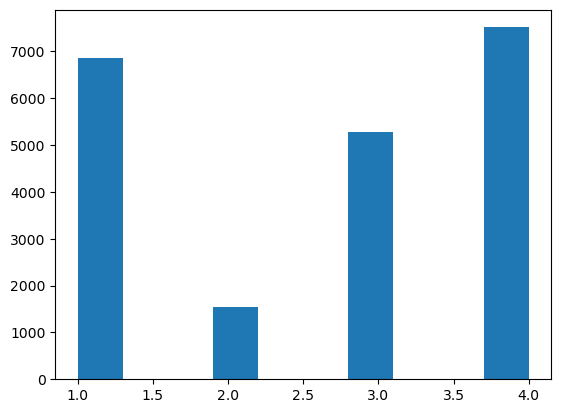

In [ ]:
plt.hist(df['Cluster'])

## Adding the calendar and temperature features to the dataframe

In [ ]:
df=df.set_index('date_time')
print(df)

                     conso_global  Hour  Cluster
date_time                                       
2017-09-01 00:00:00        0.3398     0        4
2017-09-01 01:00:00        0.3506     1        4
2017-09-01 02:00:00        0.1494     2        4
2017-09-01 03:00:00        0.1602     3        4
2017-09-01 04:00:00        0.4804     4        4
...                           ...   ...      ...
2020-01-31 19:00:00        0.9999    19        2
2020-01-31 20:00:00        0.1700    20        2
2020-01-31 21:00:00        0.5000    21        2
2020-01-31 22:00:00        0.5000    22        2
2020-01-31 23:00:00        0.5000    23        2

[21192 rows x 3 columns]


In [ ]:
temp = pd.read_csv('https://raw.githubusercontent.com/AlmudenaMaroto/OMP_1/main/Temperature_Grenoble_2016_20.csv',encoding="utf-8",sep=';')


temp = temp.drop(columns=['Unnamed: 0'])
temp['DATE']=pd.to_datetime(temp['DATE'],format='%Y-%m-%d %H:%M:%S')
df_temp = df.join(temp.set_index('DATE'),how='left')

df_temp = df_temp.reset_index()
df_temp.info()
print(df_temp)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21192 entries, 0 to 21191
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date_time     21192 non-null  datetime64[ns]
 1   conso_global  21192 non-null  float64       
 2   Hour          21192 non-null  int64         
 3   Cluster       21192 non-null  int64         
 4   TMP           20493 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(2)
memory usage: 827.9 KB
                date_time  conso_global  Hour  Cluster    TMP
0     2017-09-01 00:00:00        0.3398     0        4  14.61
1     2017-09-01 01:00:00        0.3506     1        4  14.61
2     2017-09-01 02:00:00        0.1494     2        4  14.71
3     2017-09-01 03:00:00        0.1602     3        4  14.81
4     2017-09-01 04:00:00        0.4804     4        4  14.51
...                   ...           ...   ...      ...    ...
21187 2020-01-31 19:00:00        0.99

In [ ]:


### Replace Nan value by the 24h previous value
Nan_count = 0
test_nan = df_temp["TMP"].isna()
for idx in range(len(df_temp)):
  if test_nan.loc[idx]:
    Nan_count+=1
    if idx<24:
      df_temp.loc[idx,"TMP"]=df_temp.loc[idx-1,"TMP"]
    else :
      df_temp.loc[idx,"TMP"]=df_temp.loc[idx-24,"TMP"]


### Replace Nan value by the previous valid temperature
# df_temp["TMP"].fillna(method='ffill', inplace=True)
# df_temp.info()

df_temp['Tmean'] = 0

time_inertia_temperature = 24

for idx in range(len(df_temp)):
  if idx < time_inertia_temperature :
    sum_temp = 0
    for i in range(0,time_inertia_temperature) :
      sum_temp+=df_temp.loc[i,"TMP"]
    df_temp.loc[idx,"Tmean"]=sum_temp/time_inertia_temperature

  else :
    sum_temp = 0
    for i in range(1,time_inertia_temperature+1):
      sum_temp += df_temp.loc[idx-i,"TMP"]
    df_temp.loc[idx,"Tmean"]=sum_temp/time_inertia_temperature



df = df_temp

df = df.reset_index()

df['Year'] = df['date_time'].dt.year
df['Month_name'] = df['date_time'].dt.month_name()
df['Weekday'] = df['date_time'].dt.day_name()
df['Day_number'] = df['date_time'].dt.day
df['Hour'] = df['date_time'].dt.hour


df = df.set_index('date_time')

In [ ]:
df['Calendar'] = 1
# Interruptions every year:
#df.loc[df['Month_name'] == 'July', 'Calendar'] = 0
#df.loc[df['Month_name'] == 'August', 'Calendar'] = 0

df.loc[(df['Weekday'] == 'Saturday'), 'Calendar'] = 0 # Weekends
df.loc[(df['Weekday'] == 'Sunday'), 'Calendar'] = 0 # Weekends
#2016-17
df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 26) & (df['Year'] == 2016), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 3) & (df['Year'] == 2016), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 16) & (df['Year'] == 2016)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 3) & (df['Year'] == 2017)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 17) & (df['Day_number'] < 27) & (df['Year'] == 2017) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 14) & (df['Day_number'] < 24) & (df['Year'] == 2017) , 'Calendar'] = 0
#2017-18
#df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 27) & (df['Year'] == 2017), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 6) & (df['Year'] == 2017), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 16) & (df['Year'] == 2017)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 3) & (df['Year'] == 2018)  , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 16) & (df['Day_number'] < 26) & (df['Year'] == 2018) , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 13) & (df['Day_number'] < 23) & (df['Year'] == 2018) , 'Calendar'] = 0
#2018-19
#df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 26) & (df['Year'] == 2018), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 5) & (df['Year'] == 2018), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 21) & (df['Year'] == 2018)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 3) & (df['Year'] == 2019)  , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 22)  & (df['Year'] == 2019) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'March') & (df['Day_number'] < 4)  & (df['Year'] == 2019) , 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 19) & (df['Day_number'] < 29) & (df['Year'] == 2019) , 'Calendar'] = 0
#2019-20
df.loc[(df['Month_name'] == 'August') & (df['Day_number'] < 13) & (df['Year'] == 2019), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'October') & (df['Day_number'] > 25) & (df['Year'] == 2019), 'Calendar'] = 0
#df.loc[(df['Month_name'] == 'November') & (df['Day_number'] < 4) & (df['Year'] == 2019), 'Calendar'] = 0
df.loc[(df['Month_name'] == 'December') & (df['Day_number'] > 20) & (df['Year'] == 2019)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'January') & (df['Day_number'] < 6) & (df['Year'] == 2020)  , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'February') & (df['Day_number'] > 21)  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'March') & (df['Day_number'] < 2)  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'April') & (df['Day_number'] > 17) & (df['Day_number'] < 27) & (df['Year'] == 2020) , 'Calendar'] = 0
# France quarantine
df.loc[(df['Month_name'] == 'March') & (df['Day_number'] > 16)  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'April')  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'May')  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'June')  & (df['Year'] == 2020) , 'Calendar'] = 0
df.loc[(df['Month_name'] == 'September')  & (df['Year'] == 2020) , 'Calendar'] = 0
# At Night it close too:
df.loc[(df['Hour'] > 20 )  , 'Calendar'] = 0
df.loc[(df['Hour'] < 7 ), 'Calendar'] = 0

In [ ]:
df.head()

,index,conso_global,Hour,Cluster,TMP,Tmean,Year,Month_name,Weekday,Day_number,Calendar
date_time,,,,,,,,,,,
2017-09-01 00:00:00,0,0.3398,0,4,14.61,15.318333,2017,September,Friday,1,0
2017-09-01 01:00:00,1,0.3506,1,4,14.61,15.318333,2017,September,Friday,1,0
2017-09-01 02:00:00,2,0.1494,2,4,14.71,15.318333,2017,September,Friday,1,0
2017-09-01 03:00:00,3,0.1602,3,4,14.81,15.318333,2017,September,Friday,1,0
2017-09-01 04:00:00,4,0.4804,4,4,14.51,15.318333,2017,September,Friday,1,0


In [ ]:
 #df = df.set_index('date_time')
 df.drop(columns=['Year','Month_name','Weekday','Day_number','Hour','TMP'], inplace=True)

# Applying XGBoost method to the problem

In [ ]:
hours2predict=24
hourslag=24

In [ ]:
lags = np.arange(1,hourslag+1)
lags

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])

In [ ]:
leads = np.arange(hours2predict-1)
lead_cols = [f"conso_lead_{lead+1}" for lead in leads ]
lead_cols_cal = [f"calendar_lead_{lead+1}" for lead in leads]
for lead, lead_col in zip(leads, lead_cols):
    df[lead_col] = df["conso_global"].shift(-(lead+1))

## Calendar
for lead, lead_col in zip(leads,lead_cols_cal):
    df[lead_col] = df["Calendar"].shift(-(lead+1))

lags = np.arange(1,hourslag+1)
lag_cols = [f"conso_lag_{lag}" for lag in lags ]
for lag, lag_col in zip(lags, lag_cols):
    df[lag_col] = df["conso_global"].shift(lag)

### J-7

# lags_d7 = np.arange(1,hourslag+1)
# lag_cols_d7 = [f"conso_lag_d7_{lag}" for lag in lags_d7]
# for lag, lag_col in zip(lags_d7, lag_cols_d7):
#     df[lag_col] = df["conso_global"].shift(lag+6*24)

lags_d7 = np.arange(0,hourslag)
lag_cols_d7 = [f"conso_lag_d7_{lag}" for lag in lags_d7]
for lag, lag_col in zip(lags_d7, lag_cols_d7):
    df[lag_col] = df["conso_global"].shift(7*24-lag)

# conso_lag_d7_0 : same hour we are currently but one week before
# conso_lag_d7_23 : same hour than the hour to predict +23 but one week before

## TEMPERATURE
lead_cols_temperature = [f"Tmean_lead_{lead+1}" for lead in leads]
for lead, lead_col in zip(leads,lead_cols_temperature):
    df[lead_col] = df["Tmean"].shift(-(lead+1))


## lags J-7 cluster

lag_cols_clust = [f"clust_lag_d7_{lag}" for lag in lags_d7]
for lag, lag_col in zip(lags_d7, lag_cols_clust):
    df[lag_col] = df["Cluster"].shift(7*24-lag)





C:\Users\PC\anaconda3\envs\py37\lib\site-packages\tensorflow\python\keras\api\_v1\keras\utils\__init__.py:34: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\PC\anaconda3\envs\py37\lib\site-packages\tensorflow\python\keras\api\_v1\keras\utils\__init__.py:41: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



In [ ]:
df.rename(columns={"conso_global": "conso_lead_0"}, inplace= True)
df.rename(columns={"Calendar":"calendar_lead_0"},inplace=True)
df.rename(columns={"Tmean":"Tmean_lead_0"},inplace = True)

In [ ]:

df.drop(columns=['index'],inplace=True)
df.head()

,conso_lead_0,Cluster,Tmean_lead_0,calendar_lead_0,conso_lead_1,conso_lead_2,conso_lead_3,conso_lead_4,conso_lead_5,conso_lead_6,...,clust_lag_d7_14,clust_lag_d7_15,clust_lag_d7_16,clust_lag_d7_17,clust_lag_d7_18,clust_lag_d7_19,clust_lag_d7_20,clust_lag_d7_21,clust_lag_d7_22,clust_lag_d7_23
date_time,,,,,,,,,,,,,,,,,,,,,
2017-09-01 00:00:00,0.3398,4,15.318333,0,0.3506,0.1494,0.1602,0.4804,1.5996,0.7696,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 01:00:00,0.3506,4,15.318333,0,0.1494,0.1602,0.4804,1.5996,0.7696,0.7607,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 02:00:00,0.1494,4,15.318333,0,0.1602,0.4804,1.5996,0.7696,0.7607,1.6602,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 03:00:00,0.1602,4,15.318333,0,0.4804,1.5996,0.7696,0.7607,1.6602,1.3993,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-09-01 04:00:00,0.4804,4,15.318333,0,1.5996,0.7696,0.7607,1.6602,1.3993,1.4102,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.drop(columns=['Cluster'],inplace=True)

In [ ]:
df.dropna(inplace=True)
print(len(df))

21001


In [ ]:
#Scaling
scaler = MinMaxScaler()
df['conso_lead_0'] = scaler.fit_transform(pd.DataFrame(df['conso_lead_0']))

leads = np.arange(23)
lead_cols = [f"conso_lead_{lead+1}" for lead in leads ]
for lead, lead_col in zip(leads, lead_cols):
    df[lead_col] = scaler.transform(pd.DataFrame(df[lead_col]))


lags = np.arange(1,hourslag+1)
lag_cols = [f"conso_lag_{lag}" for lag in lags ]
for lag_col in lag_cols:
    df[lag_col] = scaler.transform(pd.DataFrame(df[lag_col]))


lags_d7 = np.arange(0,hourslag)
lag_cols_d7 = [f"conso_lag_d7_{lag}" for lag in lags_d7]
for lag_col in lag_cols_d7:
    df[lag_col] = scaler.transform(pd.DataFrame(df[lag_col]))



C:\Users\PC\anaconda3\envs\py37\lib\site-packages\sklearn\base.py:493: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- conso_lead_1
Feature names seen at fit time, yet now missing:
- conso_lead_0


C:\Users\PC\anaconda3\envs\py37\lib\site-packages\sklearn\base.py:493: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- conso_lead_2
Feature names seen at fit time, yet now missing:
- conso_lead_0


C:\Users\PC\anaconda3\envs\py37\lib\site-packages\sklearn\base.py:493: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- conso_lead_3
Feature names seen at fit time, yet now missing:
- conso_lead_0


C:\Users\PC\anaconda3\envs\py37\lib\site-packages\sklea

In [ ]:
train_data = df.iloc[0:16008]
test_data = df.iloc[16008:]

train_data.shape, test_data.shape

((16008, 144), (4993, 144))

In [ ]:
lead_cols.insert(0, "conso_lead_0")
lead_cols

['conso_lead_0',
 'conso_lead_1',
 'conso_lead_2',
 'conso_lead_3',
 'conso_lead_4',
 'conso_lead_5',
 'conso_lead_6',
 'conso_lead_7',
 'conso_lead_8',
 'conso_lead_9',
 'conso_lead_10',
 'conso_lead_11',
 'conso_lead_12',
 'conso_lead_13',
 'conso_lead_14',
 'conso_lead_15',
 'conso_lead_16',
 'conso_lead_17',
 'conso_lead_18',
 'conso_lead_19',
 'conso_lead_20',
 'conso_lead_21',
 'conso_lead_22',
 'conso_lead_23']

In [ ]:
x_train_data = train_data.drop(lead_cols, axis=1)
y_train_data = train_data.loc[:, lead_cols]
x_test_data = test_data.drop(lead_cols, axis=1)
y_test_data = test_data.loc[:, lead_cols]
print(x_test_data)

                     Tmean_lead_0  calendar_lead_0  calendar_lead_1  \
date_time                                                             
2019-07-07 00:00:00     25.976667                0              0.0   
2019-07-07 01:00:00     26.035000                0              0.0   
2019-07-07 02:00:00     26.093333                0              0.0   
2019-07-07 03:00:00     26.118333                0              0.0   
2019-07-07 04:00:00     26.118333                0              0.0   
...                           ...              ...              ...   
2020-01-30 20:00:00      3.475833                1              0.0   
2020-01-30 21:00:00      3.521667                0              0.0   
2020-01-30 22:00:00      3.630000                0              0.0   
2020-01-30 23:00:00      3.759167                0              0.0   
2020-01-31 00:00:00      3.950833                0              0.0   

                     calendar_lead_2  calendar_lead_3  calendar_lead_4  \
da

In [ ]:
print(x_train_data.shape)
print(y_train_data.shape)

(16008, 120)
(16008, 24)


In [ ]:
print(x_test_data.index[1200])
print(x_test_data.shape)
print(4993-1200)

2019-08-26 00:00:00
(4993, 120)
3793


In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
import lightgbm as lgbm
from sklearn import metrics
from sklearn import model_selection

In [ ]:
print(lead_cols_cal)

['calendar_lead_1', 'calendar_lead_2', 'calendar_lead_3', 'calendar_lead_4', 'calendar_lead_5', 'calendar_lead_6', 'calendar_lead_7', 'calendar_lead_8', 'calendar_lead_9', 'calendar_lead_10', 'calendar_lead_11', 'calendar_lead_12', 'calendar_lead_13', 'calendar_lead_14', 'calendar_lead_15', 'calendar_lead_16', 'calendar_lead_17', 'calendar_lead_18', 'calendar_lead_19', 'calendar_lead_20', 'calendar_lead_21', 'calendar_lead_22', 'calendar_lead_23']


In [ ]:
delete_cal = lead_cols_cal+['calendar_lead_0']+lag_cols_clust+lead_cols_temperature+['Tmean_lead_0']

train_data_new=train_data.drop(delete_cal,axis=1)

threshold = 0
features = []
for col in y_train_data.columns:
    correlation = pd.DataFrame(train_data_new.drop(lead_cols, axis=1).corrwith(train_data_new[col]), columns=['corr'])
    thresh_corr = correlation[correlation['corr']> threshold]
    features.append(list(thresh_corr.index))


In [ ]:

print(train_data_new)
print(delete_cal)
# print(features)
pd.DataFrame(features)

                     conso_lead_0  conso_lead_1  conso_lead_2  conso_lead_3  \
date_time                                                                     
2017-09-08 00:00:00      0.005333      0.005768      0.032439      0.011537   
2017-09-08 01:00:00      0.005768      0.032439      0.011537      0.011533   
2017-09-08 02:00:00      0.032439      0.011537      0.011533      0.011581   
2017-09-08 03:00:00      0.011537      0.011533      0.011581      0.011533   
2017-09-08 04:00:00      0.011533      0.011581      0.011533      0.097709   
...                           ...           ...           ...           ...   
2019-07-06 19:00:00      0.022648      0.011102      0.011102      0.022204   
2019-07-06 20:00:00      0.011102      0.011102      0.022204      0.003553   
2019-07-06 21:00:00      0.011102      0.022204      0.003553      0.003997   
2019-07-06 22:00:00      0.022204      0.003553      0.003997      0.036858   
2019-07-06 23:00:00      0.003553      0.003997     

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_6,conso_lag_7,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_18,conso_lag_d7_19,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
1,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_6,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_19,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
2,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_5,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_20,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
3,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_4,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_21,conso_lag_d7_22,conso_lag_d7_23
4,conso_lag_1,conso_lag_2,conso_lag_3,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_22,conso_lag_d7_23
5,conso_lag_1,conso_lag_2,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_23
6,conso_lag_1,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_4,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13
7,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,conso_lag_19,...,conso_lag_d7_5,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14
8,conso_lag_9,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,conso_lag_18,...,conso_lag_d7_6,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14,conso_lag_d7_15
9,conso_lag_8,conso_lag_9,conso_lag_10,conso_lag_11,conso_lag_12,conso_lag_13,conso_lag_14,conso_lag_15,conso_lag_16,conso_lag_17,...,conso_lag_d7_7,conso_lag_d7_8,conso_lag_d7_9,conso_lag_d7_10,conso_lag_d7_11,conso_lag_d7_12,conso_lag_d7_13,conso_lag_d7_14,conso_lag_d7_15,conso_lag_d7_16


In [ ]:
from sklearn.model_selection import train_test_split
import lazypredict
from lazypredict.Supervised import LazyRegressor

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

result = pd.DataFrame()
models = dict()

for counter, col in enumerate(y_train_data.columns):
    result[f'pred_{counter}'] = np.zeros(y_test_data.shape[0])

    used_features = features[counter] + [f"calendar_lead_{counter}"] + [f"clust_lag_d7_{counter}"] + [f"Tmean_lead_{counter}"]

    print("heure faite :", counter)

    x_train_local = x_train_data.loc[:, used_features]
    y_train_local = y_train_data.loc[:, col]
    x_test_local = x_test_data.loc[:, used_features]
    y_test_local = y_test_data.loc[:, col]

    reg= LazyRegressor(verbose=0,ignore_warnings=True,custom_metric=None)
    n_splits = 6
    cv = KFold(n_splits=n_splits, shuffle=True, random_state=42)


#   val_scores = [0] * n_splits
#   feature_importances = pd.DataFrame(index=x_train_local.columns)

    for i, (fit_idx, val_idx) in enumerate(cv.split(x_train_local, y_train_local)):
        X_fit = x_train_local.iloc[fit_idx]
        y_fit = y_train_local.iloc[fit_idx]
        X_val = x_train_local.iloc[val_idx]
        y_val = y_train_local.iloc[val_idx]

        train1,test1=reg.fit(X_fit,X_val,y_fit,y_val)



        #val_scores[i] = model.get_best_score()['validation']['RMSE']
        #result[f'pred_{counter}'] += model.predict(x_test_local, ntree_end=model.best_iteration_)

        #feature_importances[i] = model.get_feature_importance()

        print('Fold {}'.format(i+1))
        print(test1)
#    result[f'pred_{counter}'] /= n_splits
#    result[f'pred_{counter}'] = np.expm1(result[f'pred_{counter}'])

#    val_mean = np.mean(val_scores)
#    val_std = np.std(val_scores)

#    print('Local RMSLE: {:.5f} (±{:.5f})'.format(val_mean, val_std))
#    models[col] = model

heure faite : 0


 74%|████████████████████████████████████████████████████████████▌                     | 31/42 [02:48<01:07,  6.15s/it]

In [ ]:
test1

,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
ExtraTreesRegressor,0.83,0.83,0.76,9.78
LGBMRegressor,0.82,0.82,0.77,0.57
RandomForestRegressor,0.82,0.82,0.77,37.42
HistGradientBoostingRegressor,0.82,0.82,0.77,1.43
XGBRegressor,0.81,0.81,0.79,0.94
NuSVR,0.80,0.81,0.80,11.35
SVR,0.80,0.81,0.80,10.27
BaggingRegressor,0.80,0.80,0.82,3.75
GradientBoostingRegressor,0.79,0.80,0.82,9.33


#catboost

In [ ]:
import xgboost as xgb
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np

result = pd.DataFrame()
models = dict()

for counter, col in enumerate(y_train_data.columns):
    result[f'pred_{counter}'] = np.zeros(y_test_data.shape[0])

    used_features = features[counter] + [f"calendar_lead_{counter}"] + [f"clust_lag_d7_{counter}"] + [f"Tmean_lead_{counter}"]

    print("heure faite :", counter)

    x_train_local = x_train_data.loc[:, used_features]
    y_train_local = y_train_data.loc[:, col]
    x_test_local = x_test_data.loc[:, used_features]
    y_test_local = y_test_data.loc[:, col]

    model = xgb.XGBRegressor(
        objective='reg:squarederror',
        max_depth=5,
        learning_rate=0.007,
        n_estimators=30000,
        min_child_weight=80,
        subsample=0.8,
        colsample_bytree=0.7,
        reg_alpha=0,
        reg_lambda=0,
        random_state=np.random.randint(10e6),
        eval_metric= 'rmse'
    )

    n_splits = 6
    cv = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    val_scores = [0] * n_splits
    feature_importances = pd.DataFrame(index=x_train_local.columns)

    for i, (fit_idx, val_idx) in enumerate(cv.split(x_train_local, y_train_local)):
        X_fit = x_train_local.iloc[fit_idx]
        y_fit = y_train_local.iloc[fit_idx]
        X_val = x_train_local.iloc[val_idx]
        y_val = y_train_local.iloc[val_idx]

        model.fit(
            X_fit,
            y_fit,
            eval_set=[(X_val, y_val)],
            early_stopping_rounds=200,
            verbose=False
        )

        val_scores[i] = model.best_score
        result[f'pred_{counter}'] += model.predict(x_test_local)
        feature_importances[i] = model.feature_importances_

        print('Fold {} RMSLE: {:.5f}'.format(i+1, val_scores[i]))

    result[f'pred_{counter}'] /= n_splits
    result[f'pred_{counter}'] = np.expm1(result[f'pred_{counter}'])

    val_mean = np.mean(val_scores)
    val_std = np.std(val_scores)

    print('Local RMSLE: {:.5f} (±{:.5f})'.format(val_mean, val_std))
    models[col] = model


heure faite : 0
Fold 1 RMSLE: 0.03423
Fold 2 RMSLE: 0.03392
Fold 3 RMSLE: 0.03529
Fold 4 RMSLE: 0.03336
Fold 5 RMSLE: 0.03624
Fold 6 RMSLE: 0.03488
Local RMSLE: 0.03465 (±0.00094)
heure faite : 1
Fold 1 RMSLE: 0.03667
Fold 2 RMSLE: 0.03660
Fold 3 RMSLE: 0.03842
Fold 4 RMSLE: 0.03561
Fold 5 RMSLE: 0.03626
Fold 6 RMSLE: 0.03632
Local RMSLE: 0.03665 (±0.00087)
heure faite : 2
Fold 1 RMSLE: 0.03859
Fold 2 RMSLE: 0.03662
Fold 3 RMSLE: 0.03861
Fold 4 RMSLE: 0.03791
Fold 5 RMSLE: 0.03782
Fold 6 RMSLE: 0.03853
Local RMSLE: 0.03801 (±0.00070)
heure faite : 3
Fold 1 RMSLE: 0.03986
Fold 2 RMSLE: 0.03949
Fold 3 RMSLE: 0.03807
Fold 4 RMSLE: 0.03848
Fold 5 RMSLE: 0.03957
Fold 6 RMSLE: 0.03943
Local RMSLE: 0.03915 (±0.00064)
heure faite : 4
Fold 1 RMSLE: 0.04209
Fold 2 RMSLE: 0.03886
Fold 3 RMSLE: 0.03896
Fold 4 RMSLE: 0.03965
Fold 5 RMSLE: 0.03899
Fold 6 RMSLE: 0.04008
Local RMSLE: 0.03977 (±0.00112)
heure faite : 5
Fold 1 RMSLE: 0.04159
Fold 2 RMSLE: 0.03965
Fold 3 RMSLE: 0.03994
Fold 4 RMSLE: 0.03

In [ ]:
result

,pred_0,pred_1,pred_2,pred_3,pred_4,pred_5,pred_6,pred_7,pred_8,pred_9,...,pred_14,pred_15,pred_16,pred_17,pred_18,pred_19,pred_20,pred_21,pred_22,pred_23
0,0.019080,0.533531,0.693115,0.521363,0.697784,0.710888,0.593319,0.593705,0.591058,0.600238,...,0.612715,0.600332,0.629805,0.613925,0.613131,0.602305,0.607153,0.607217,0.573152,0.542877
1,0.018659,0.690416,0.544235,0.604037,0.705706,0.594872,0.591930,0.593975,0.599920,0.611887,...,0.598495,0.629693,0.609457,0.622440,0.598836,0.609238,0.614063,0.585831,0.581331,0.555147
2,0.024488,0.525082,0.597143,0.747230,0.596041,0.589159,0.593248,0.600160,0.613499,0.595721,...,0.630121,0.606664,0.618800,0.595694,0.606985,0.610999,0.591824,0.609988,0.607600,0.655723
3,0.018406,0.603995,0.715705,0.519532,0.590505,0.594965,0.600319,0.610253,0.593731,0.599322,...,0.609505,0.613865,0.597015,0.601858,0.611157,0.593261,0.605596,0.594831,0.594385,0.659270
4,0.020562,0.724762,0.543311,0.519549,0.594247,0.594087,0.612251,0.595850,0.596668,0.617547,...,0.616477,0.596683,0.602520,0.615592,0.591315,0.606916,0.601099,0.587016,0.603886,0.658274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4988,0.032464,0.748754,0.692774,0.730378,0.824337,0.767758,1.176795,0.815673,0.786379,1.281139,...,93.804487,155.826496,98.727145,105.565232,169.371579,94.369311,78.854010,614.040620,12.669601,1.299387
4989,0.025199,0.694503,0.703894,0.734053,0.764336,1.139729,0.783259,0.789591,1.350241,16.231242,...,166.377761,94.000998,105.588056,174.243862,95.500535,80.924430,609.307374,13.321403,1.302453,1.029218
4990,0.024021,0.731037,0.712236,0.634938,1.035742,0.799945,0.790626,1.293300,16.131893,89.741714,...,98.017444,110.812417,171.610180,92.394251,79.115374,541.622099,12.799831,1.275778,1.037486,0.689530
4991,0.024645,0.777736,0.617111,0.941509,0.791727,0.792623,1.369571,17.106941,89.886854,93.579517,...,109.150423,173.389731,94.468388,80.564462,542.702890,13.154995,1.270027,1.042814,0.631922,0.676923


In [ ]:
print(len(y_test_data))
print(len(result))
y_test_data.head(90)

4993
4993


,conso_lead_0,conso_lead_1,conso_lead_2,conso_lead_3,conso_lead_4,conso_lead_5,conso_lead_6,conso_lead_7,conso_lead_8,conso_lead_9,...,conso_lead_14,conso_lead_15,conso_lead_16,conso_lead_17,conso_lead_18,conso_lead_19,conso_lead_20,conso_lead_21,conso_lead_22,conso_lead_23
date_time,,,,,,,,,,,,,,,,,,,,,
2019-07-07 00:00:00,0.003997,0.036858,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,...,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102
2019-07-07 01:00:00,0.036858,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,...,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102
2019-07-07 02:00:00,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,...,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.044407
2019-07-07 03:00:00,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,...,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.044407,0.036858
2019-07-07 04:00:00,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,0.033745,0.051517,0.007549,0.007105,...,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.044407,0.036858,0.015098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-10 13:00:00,0.107958,0.177979,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,...,0.055069,0.037298,0.059061,0.081714,0.096363,0.081265,0.125228,0.089254,0.147876,0.110578
2019-07-10 14:00:00,0.177979,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,0.044407,...,0.037298,0.059061,0.081714,0.096363,0.081265,0.125228,0.089254,0.147876,0.110578,0.103908
2019-07-10 15:00:00,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,0.044407,0.044403,...,0.059061,0.081714,0.096363,0.081265,0.125228,0.089254,0.147876,0.110578,0.103908,0.147880


In [ ]:
final_test = y_test_data.iloc[[i for i in range(0,len(y_test_data),24)]]
final_result = result.iloc[[i for i in range(0,len(result),24)]]
final_test

,conso_lead_0,conso_lead_1,conso_lead_2,conso_lead_3,conso_lead_4,conso_lead_5,conso_lead_6,conso_lead_7,conso_lead_8,conso_lead_9,...,conso_lead_14,conso_lead_15,conso_lead_16,conso_lead_17,conso_lead_18,conso_lead_19,conso_lead_20,conso_lead_21,conso_lead_22,conso_lead_23
date_time,,,,,,,,,,,,,,,,,,,,,
2019-07-07,0.003997,0.036858,0.012390,0.012523,0.011946,0.007549,0.011102,0.011102,0.022204,0.003553,...,0.029753,0.014654,0.029753,0.022204,0.022204,0.012390,0.012523,0.011946,0.007549,0.011102
2019-07-08,0.011102,0.044407,0.036858,0.015098,0.014654,0.079888,0.117235,0.076869,0.081265,0.088810,...,0.161336,0.346336,0.266438,0.444071,0.074160,0.014654,0.022208,0.036853,0.029753,0.003553
2019-07-09,0.003997,0.036858,0.014654,0.015098,0.014654,0.048404,0.077712,0.066611,0.088810,0.140331,...,0.089254,0.176660,0.178157,0.184738,0.044403,0.007549,0.014654,0.036858,0.051956,0.015098
2019-07-10,0.014654,0.018651,0.018207,0.007549,0.049243,0.064484,0.056353,0.066611,0.067055,0.081265,...,0.177979,0.207026,0.140677,0.333147,0.095831,0.044412,0.051956,0.044403,0.059066,0.044407
2019-07-11,0.044403,0.059501,0.040855,0.055069,0.037298,0.059061,0.081714,0.096363,0.081265,0.125228,...,0.147880,0.200361,0.147791,0.229669,0.036774,0.022204,0.022204,0.022204,0.022204,0.007549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-27,0.014654,0.012390,0.012523,0.041254,0.059510,0.027395,0.135575,0.192287,0.304273,0.370356,...,0.310224,0.192820,0.184294,0.163414,0.100360,0.048803,0.033749,0.034282,0.034149,0.067059
2020-01-28,0.038585,0.035570,0.027577,0.027488,0.028021,0.039123,0.171190,0.139128,0.198105,0.183264,...,0.186559,0.214926,0.133226,0.296196,0.088814,0.073720,0.015094,0.036858,0.016919,0.016386
2020-01-29,0.075892,0.031573,0.022204,0.014654,0.051512,0.060038,0.139794,0.192727,0.207293,0.238862,...,0.184649,0.177100,0.111546,0.155425,0.074160,0.051961,0.014654,0.014654,0.030597,0.031174


In [ ]:
final_result

,pred_0,pred_1,pred_2,pred_3,pred_4,pred_5,pred_6,pred_7,pred_8,pred_9,...,pred_14,pred_15,pred_16,pred_17,pred_18,pred_19,pred_20,pred_21,pred_22,pred_23
0,0.017044,0.021627,0.021759,0.019296,0.024488,0.025768,0.021657,0.020161,0.020226,0.018950,...,0.018375,0.019639,0.021988,0.022211,0.022657,0.020170,0.019791,0.019522,0.017792,0.017548
24,0.016826,0.016281,0.015118,0.017818,0.019067,0.022128,0.031501,0.092117,0.118104,0.143279,...,0.198917,0.231264,0.205182,0.171728,0.060323,0.028529,0.026758,0.012441,0.015070,0.016616
48,0.022947,0.027075,0.019945,0.017682,0.021815,0.025594,0.036508,0.082719,0.106886,0.146143,...,0.261586,0.313560,0.274590,0.255345,0.076979,0.042588,0.026618,0.016182,0.019991,0.023006
72,0.018998,0.022660,0.021367,0.019449,0.025005,0.039097,0.049197,0.093960,0.110348,0.125422,...,0.148363,0.162796,0.167958,0.132731,0.059210,0.032550,0.027273,0.018418,0.021716,0.025521
96,0.023491,0.020164,0.023075,0.024017,0.020994,0.027983,0.046769,0.093667,0.085751,0.076040,...,0.178680,0.195414,0.225653,0.253437,0.111287,0.043544,0.052287,0.017628,0.016121,0.016901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4896,0.027176,0.024158,0.022441,0.030139,0.027503,0.045272,0.112227,0.226449,0.239570,0.256381,...,0.239530,0.243019,0.231997,0.184253,0.067793,0.038405,0.034447,0.023656,0.025135,0.028395
4920,0.026960,0.028260,0.027140,0.031385,0.044644,0.108557,0.198707,0.273957,0.349788,0.307916,...,0.291984,0.252900,0.212596,0.177894,0.087262,0.034063,0.024727,0.020521,0.021713,0.020302
4944,0.020189,0.024705,0.024290,0.023908,0.022706,0.041418,0.150484,0.202141,0.256752,0.226380,...,0.206765,0.213670,0.226611,0.198781,0.094358,0.032228,0.023117,0.018682,0.020487,0.022689
4968,0.019560,0.020561,0.026227,0.024851,0.024352,0.059742,0.168422,0.226245,0.237444,0.232379,...,0.186662,0.198763,0.189892,0.176777,0.106793,0.061053,0.043472,0.029586,0.025436,0.025716


In [ ]:
final_test = final_test.values.flatten()
print(final_test)
final_result = final_result.values.flatten()
print(final_result)

[0.00399664 0.03685793 0.01238959 ... 0.02220357 0.02220357 0.02220357]
[0.01704365 0.02162676 0.02175925 ... 0.01264826 0.01917397 0.02136165]


In [ ]:
final=pd.DataFrame(np.array([final_test,final_result]).T,columns=["test","result"])

In [ ]:
# plt.figure(figsize=(18,5))

# plt.plot(final_test[330:500], marker='.',label='Target')
# plt.plot(final_resut[330:500], marker='.', label='Predictions')
# plt.title('Elec consumption')
# plt.xlabel('Time(h)')
# plt.ylabel('Elec consump (khw)')
# plt.legend()
# plt.show()

In [ ]:
fig = px.line(final, x =final.index, y = 'test', title = 'XGBoost Performance')
fig.update_xaxes(rangeslider_visible = True)
fig.data[-1].name = 'real'
fig.data[-1].showlegend=True
fig.add_scatter(x =final.index, y =final['result'], name='predict')
fig.show()


In [ ]:
from sklearn.metrics import mean_absolute_error
from math import sqrt

(mean_absolute_error(final_test, final_result))

0.028122355521831625

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

sqrt(mean_squared_error(final_test, final_result))

0.044934287475453374

In [ ]:
r2_score(final_test[:],final_result[:])

0.6533325737615763

In [ ]:
def R2score_analysis(real_list,predict_list,period_days,start_comparison):
  nbr_values_per_period=period_days*24

  predict_value=predict_list[start_comparison:]
  real_value=real_list[start_comparison:]

  R2_liste=[]
  max = 0

  for k in range(0,len(predict_value),nbr_values_per_period):
    if k+nbr_values_per_period<len(predict_value):
      R2=r2_score(real_value[k:k+nbr_values_per_period+1],predict_value[k:k+nbr_values_per_period+1])
      R2_liste=R2_liste+[R2]*nbr_values_per_period

    else : pass

  print(R2_liste)
  print("best R2 score :",np.max(R2_liste),"corresponding period :")
  print("lowest R2 score :",np.min(R2_liste),"corresponding period :")

  nbr_missing_value=len(predict_value)-len(R2_liste)
  R2_liste=R2_liste+[r2_score(real_value[-nbr_missing_value:],predict_value[-nbr_missing_value:])]*nbr_missing_value

  # plotting the prediction, the reality and the R2 score of each period, to see where there are issues of prediction
  final2=pd.DataFrame(np.array([real_value,predict_value,R2_liste]).T,columns=["real","prediction","R2_score"])

  subfig = make_subplots(specs=[[{"secondary_y": True}]])

  # create two independent figures with px.line each containing data from multiple columns
  fig = px.line(final2, x=final2.index, y = 'real', title = 'Comparation graph')
  fig.add_scatter(x =final2.index, y =final2['prediction'], name='predict')

  fig2 = px.line(final2, x=final2.index, y = 'R2_score')

  fig2.update_traces(yaxis="y2")


  subfig.add_traces(fig.data + fig2.data)
  subfig.layout.xaxis.title="hours"
  subfig.layout.yaxis.title="consumption"
  subfig.layout.yaxis2.title="R2_score"
  subfig.layout.yaxis2.range=[0,1]

  # recoloring is necessary otherwise lines from fig und fig2 would share each color
  # e.g. Linear-, Log- = blue; Linear+, Log+ = red... we don't want this
  subfig.for_each_trace(lambda t: t.update(line=dict(color=t.marker.color)))
  subfig.show()
  return(R2_liste)

R2score_analysis(final_test,final_result,7,0)
R2_list_test=R2score_analysis(final_test,final_result,7,0)




[0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916,

[0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916, 0.5679337879835916,

affichage de la prédiction, de la donnée réelle et du R2 score

[-0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.010948387306767504, -0.0109483

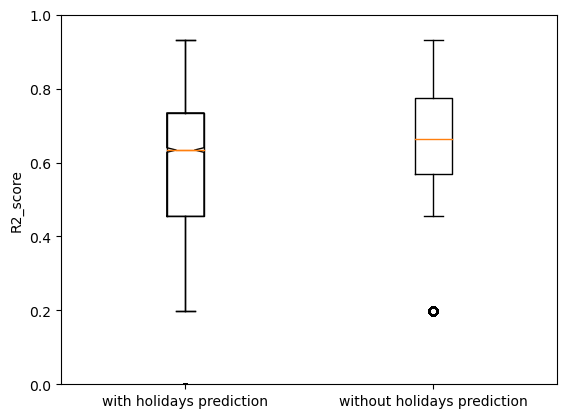

In [ ]:
R2_list_test
R2_list_test_positive = []
R2_list_test_negative = []

for r2 in R2_list_test :
  if r2 > 0:
     R2_list_test_positive.append(r2)

  else :
    R2_list_test_negative.append(r2)

print(R2_list_test_negative)

print(max(R2_list_test_positive))

plt.boxplot(R2_list_test, R2_list_test_positive)

import pylab

BoxName = ['with holidays prediction','without holidays prediction']

data = [R2_list_test,R2_list_test_positive]

plt.boxplot(data)

plt.ylim(0,1)


plt.ylabel('R2_score')
pylab.xticks([1,2], BoxName)


plt.show()



In [ ]:
print(x_test_data.index[2491])

2019-10-18 19:00:00


In [ ]:
print(test_data)

                     conso_lead_0  Tmean_lead_0  calendar_lead_0  \
date_time                                                          
2019-07-07 00:00:00      0.003997     25.976667                0   
2019-07-07 01:00:00      0.036858     26.035000                0   
2019-07-07 02:00:00      0.012390     26.093333                0   
2019-07-07 03:00:00      0.012523     26.118333                0   
2019-07-07 04:00:00      0.011946     26.118333                0   
...                           ...           ...              ...   
2020-01-30 20:00:00      0.018207      3.475833                1   
2020-01-30 21:00:00      0.007549      3.521667                0   
2020-01-30 22:00:00      0.022204      3.630000                0   
2020-01-30 23:00:00      0.022204      3.759167                0   
2020-01-31 00:00:00      0.003553      3.950833                0   

                     conso_lead_1  conso_lead_2  conso_lead_3  conso_lead_4  \
date_time                           

In [ ]:
feature_importances
mfi=feature_importances.mean(axis=1)
mfi.sort_values()

conso_lag_d7_5      0.006257
conso_lag_21        0.006564
conso_lag_d7_3      0.007280
conso_lag_20        0.007353
conso_lag_d7_20     0.007513
conso_lag_d7_19     0.008175
conso_lag_d7_2      0.008533
conso_lag_22        0.008557
conso_lag_4         0.008816
conso_lag_d7_4      0.008896
conso_lag_d7_18     0.009028
conso_lag_5         0.009547
conso_lag_d7_1      0.010105
conso_lag_23        0.010240
conso_lag_7         0.011981
conso_lag_3         0.013345
conso_lag_6         0.014914
conso_lag_d7_0      0.015627
conso_lag_24        0.016191
conso_lag_d7_17     0.017819
conso_lag_d7_21     0.019372
Tmean_lead_23       0.019875
conso_lag_2         0.032254
clust_lag_d7_23     0.037329
conso_lag_d7_16     0.044714
conso_lag_1         0.079290
conso_lag_d7_22     0.138834
calendar_lead_23    0.166824
conso_lag_d7_23     0.254768
dtype: float32

In [ ]:
feature_imp = pd.DataFrame(mfi.sort_values())

In [ ]:
feature_imp.reset_index()

,index,0
0,conso_lag_d7_5,0.006257
1,conso_lag_21,0.006564
2,conso_lag_d7_3,0.007280
3,conso_lag_20,0.007353
4,conso_lag_d7_20,0.007513
5,conso_lag_d7_19,0.008175
6,conso_lag_d7_2,0.008533
7,conso_lag_22,0.008557
8,conso_lag_4,0.008816
9,conso_lag_d7_4,0.008896


In [ ]:
pd.DataFrame(sorted(zip(mfi,mfi.index)), columns=['Value','Feature'])

,Value,Feature
0,0.006257,conso_lag_d7_5
1,0.006564,conso_lag_21
2,0.007280,conso_lag_d7_3
3,0.007353,conso_lag_20
4,0.007513,conso_lag_d7_20
5,0.008175,conso_lag_d7_19
6,0.008533,conso_lag_d7_2
7,0.008557,conso_lag_22
8,0.008816,conso_lag_4
9,0.008896,conso_lag_d7_4


In [ ]:
feature_imp = pd.DataFrame(sorted(zip(mfi,mfi.index)), columns=['Value','Feature'])
feature_imp

,Value,Feature
0,0.006257,conso_lag_d7_5
1,0.006564,conso_lag_21
2,0.007280,conso_lag_d7_3
3,0.007353,conso_lag_20
4,0.007513,conso_lag_d7_20
5,0.008175,conso_lag_d7_19
6,0.008533,conso_lag_d7_2
7,0.008557,conso_lag_22
8,0.008816,conso_lag_4
9,0.008896,conso_lag_d7_4


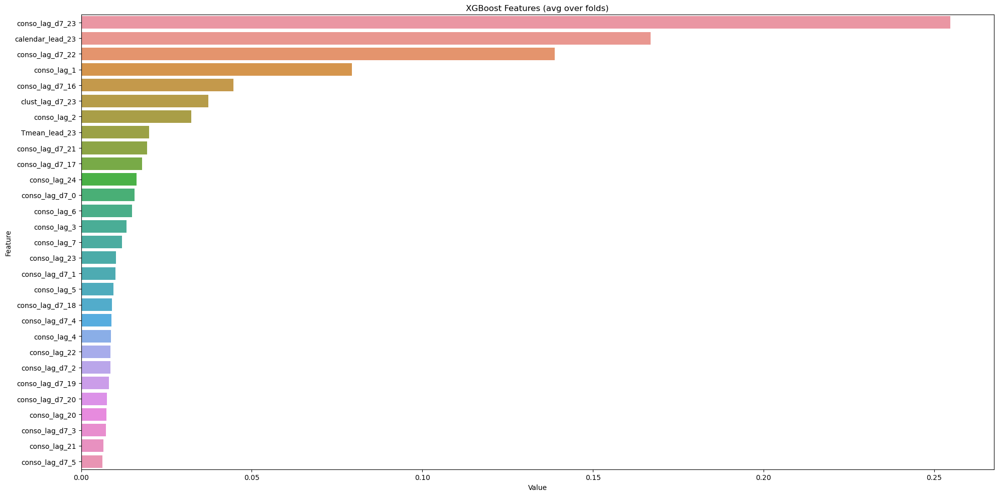

<Figure size 640x480 with 0 Axes>

In [ ]:
plt.figure(figsize=(20, 10))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('XGBoost Features (avg over folds)')
plt.tight_layout()
plt.show()
plt.savefig('XGBoost_importances-01.png')